In [1]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

2025-02-18 13:52:37.313609: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-18 13:52:37.668273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1739915557.800346   59064 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1739915557.831775   59064 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-18 13:52:38.117072: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
image_path = '../temp/training/Images/'
mask_path = '../temp/training/Masks/'
SIZE = 128

In [3]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 3141/3141 [00:13<00:00, 227.32it/s]


In [5]:
# Train test split
# images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.01)

# Train test split with no images left for testing
images_train = images
images_test = []
mask_train = masks
mask_test = []

print(f'Train images: {len(images_train)}')
print(f'Test images: {len(images_test)}')

Train images: 3141
Test images: 0


In [6]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [7]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

I0000 00:00:1739915616.340072   59064 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9682 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:01:00.0, compute capability: 6.1


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100


I0000 00:00:1739915625.715172   59461 service.cc:148] XLA service 0x7fe590016640 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1739915625.715372   59461 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1080 Ti, Compute Capability 6.1
2025-02-18 13:53:45.793072: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1739915626.132546   59461 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-02-18 13:53:46.820185: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[32,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_con

 2/99 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.3371 - loss: 0.6986  

2025-02-18 13:53:54.753503: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_4', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1739915634.781532   59461 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


97/99 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - accuracy: 0.5633 - loss: 0.6019

2025-02-18 13:53:59.592204: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[5,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[5,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-02-18 13:53:59.612779: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[5,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[5,16,128,128]{3,2,1,0}, f32[16,16,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward

99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.5641 - loss: 0.6008

2025-02-18 13:54:04.240842: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'input_transpose_fusion_5', 8 bytes spill stores, 8 bytes spill loads

2025-02-18 13:54:04.465056: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} for conv (f32[1,16,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,3,128,128]{3,2,1,0}, f32[16,3,3,3]{3,2,1,0}, f32[16]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-02-18 13:54:04.486836: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{} f

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step


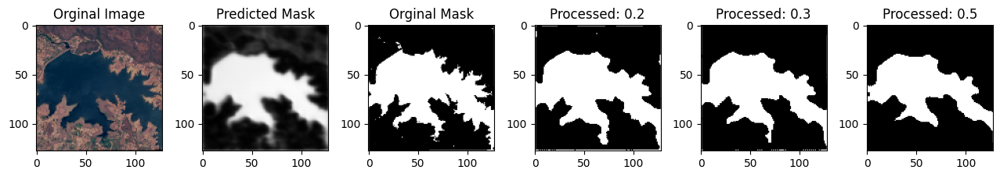

99/99 ━━━━━━━━━━━━━━━━━━━━ 21s 106ms/step - accuracy: 0.5645 - loss: 0.6003
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.6755 - loss: 0.44


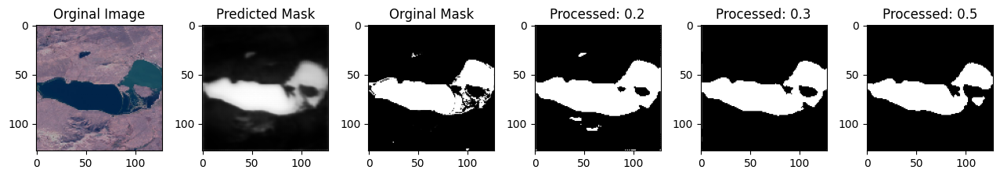

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.6757 - loss: 0.4438
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7002 - loss: 0.397


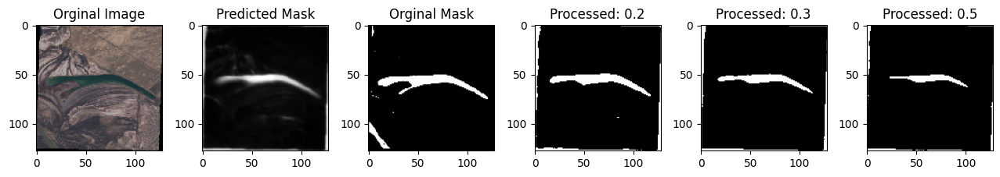

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7004 - loss: 0.3969
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7088 - loss: 0.37


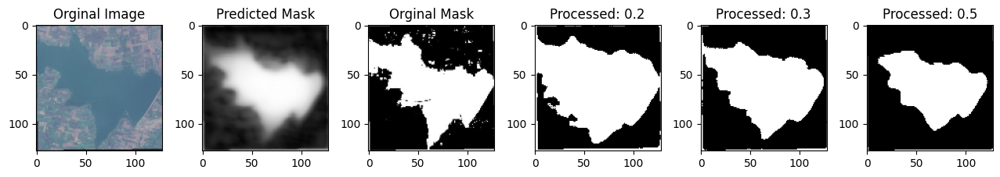

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7088 - loss: 0.3708
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7260 - loss: 0.338


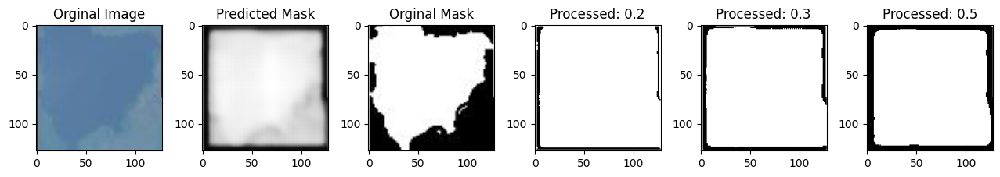

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7259 - loss: 0.3389
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7267 - loss: 0.32


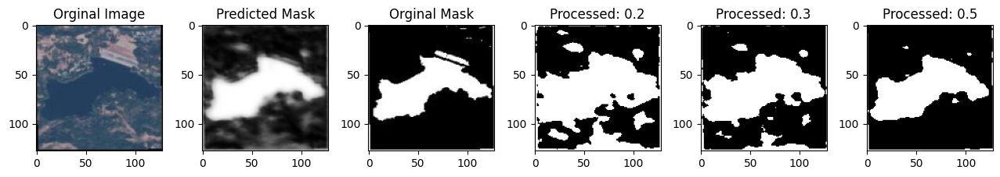

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7267 - loss: 0.3270
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7305 - loss: 0.32


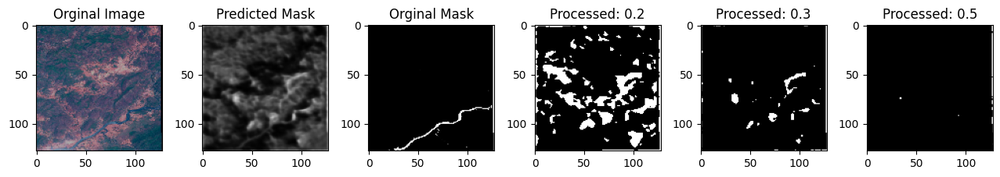

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7303 - loss: 0.3284
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7379 - loss: 0.30


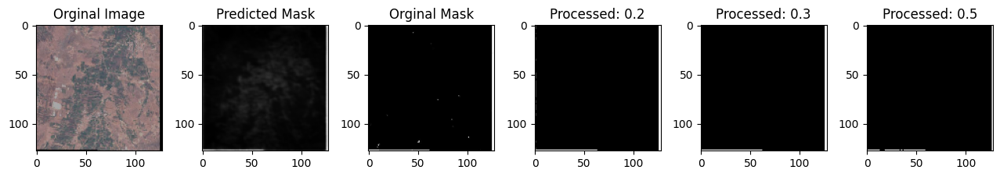

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7378 - loss: 0.3085
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7395 - loss: 0.29


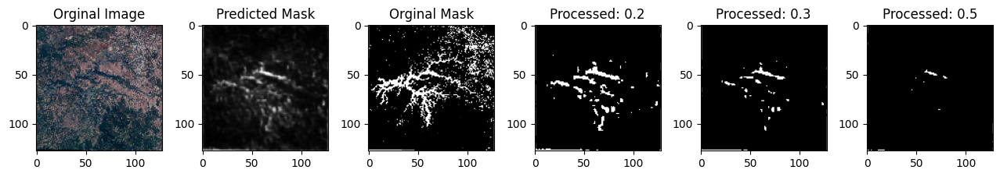

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7395 - loss: 0.2907
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7347 - loss: 0.293


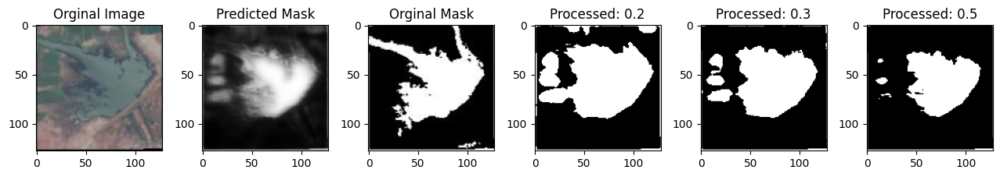

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7348 - loss: 0.2931
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7336 - loss: 0.31


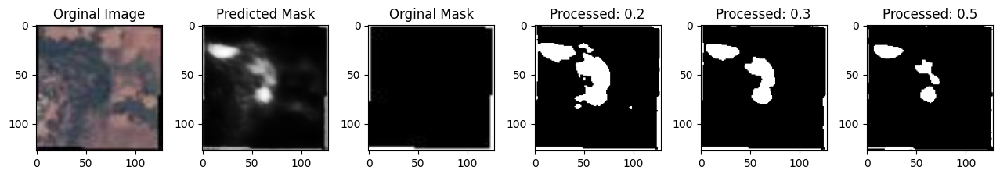

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7337 - loss: 0.3142
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7452 - loss: 0.28


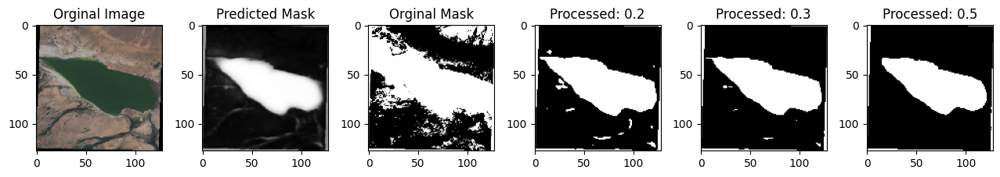

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7452 - loss: 0.2885
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7424 - loss: 0.29


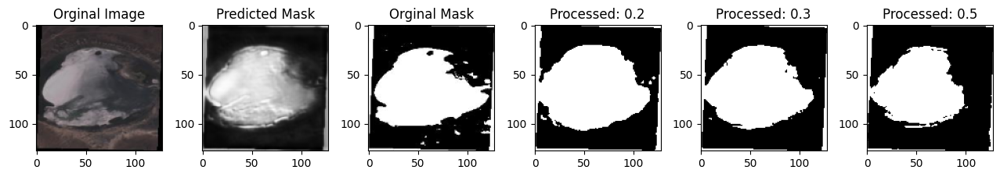

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7424 - loss: 0.2954
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7428 - loss: 0.287


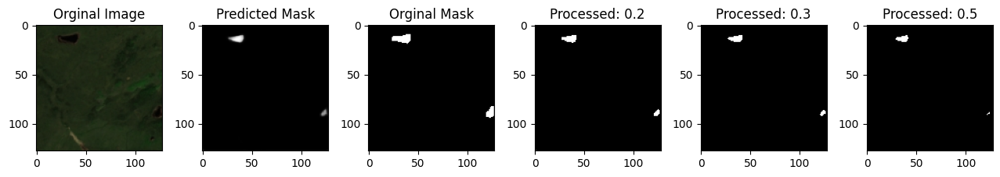

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7428 - loss: 0.2873
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7406 - loss: 0.28


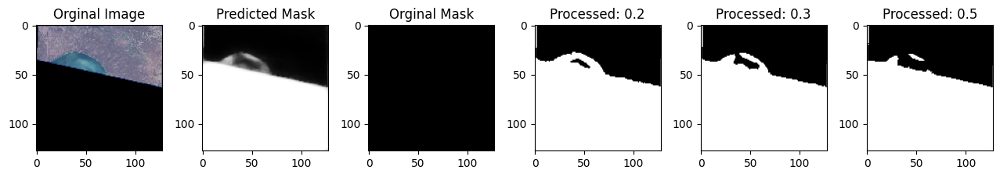

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.7407 - loss: 0.2890
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7343 - loss: 0.29


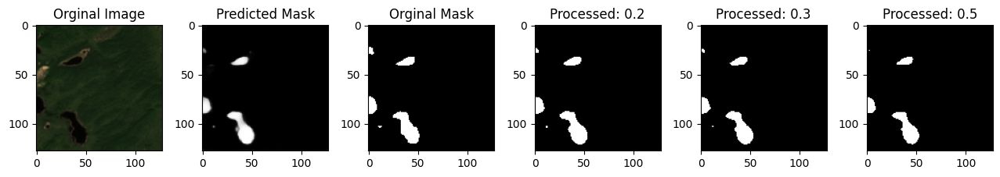

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7346 - loss: 0.2945
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7478 - loss: 0.27


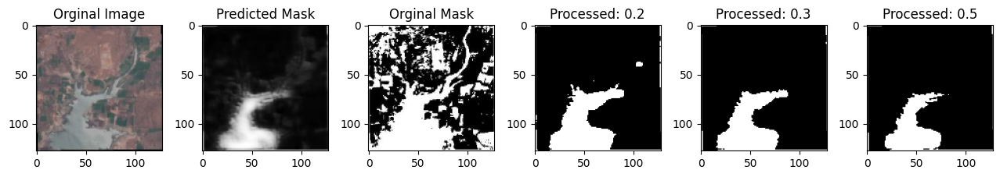

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7478 - loss: 0.2729
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7534 - loss: 0.25


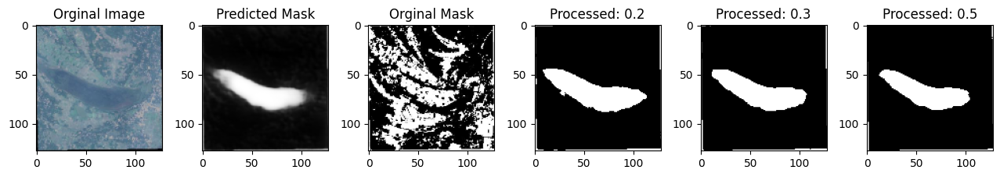

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7533 - loss: 0.2597
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7485 - loss: 0.26


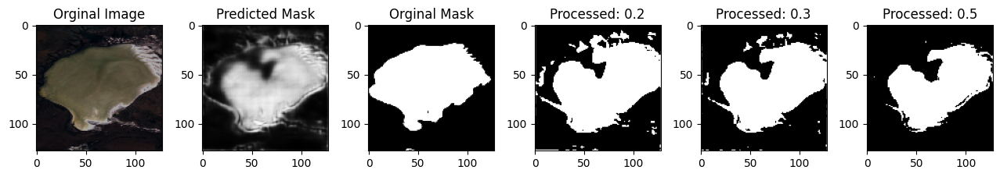

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7486 - loss: 0.2667
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7430 - loss: 0.275


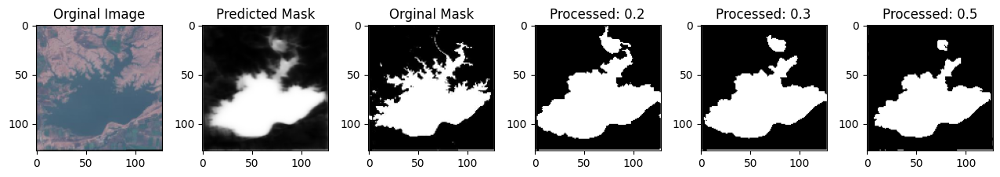

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7430 - loss: 0.2750
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7535 - loss: 0.256


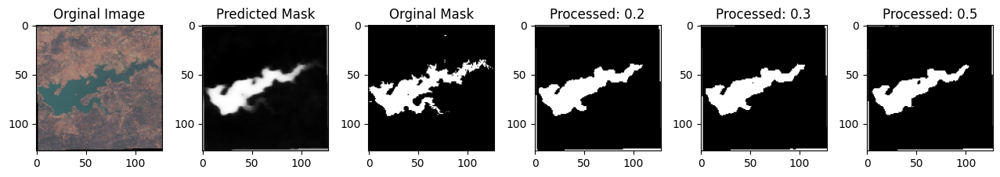

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7535 - loss: 0.2563
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7493 - loss: 0.25


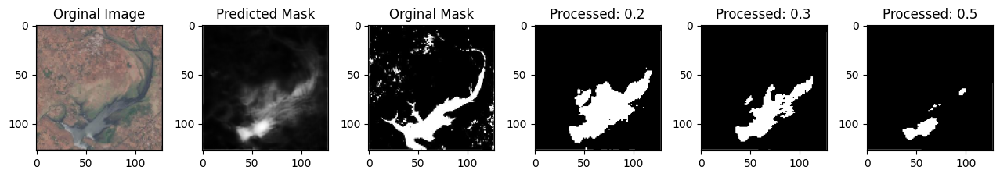

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7494 - loss: 0.2560
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/stepep - accuracy: 0.7515 - loss: 0.269


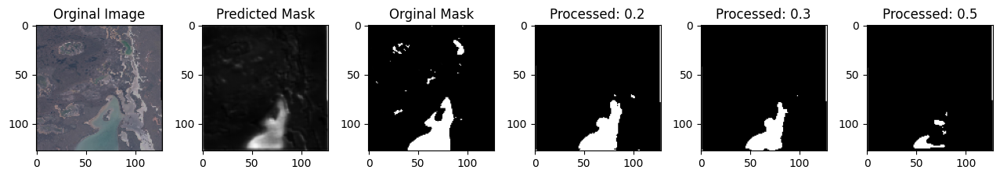

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7514 - loss: 0.2697
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7482 - loss: 0.27


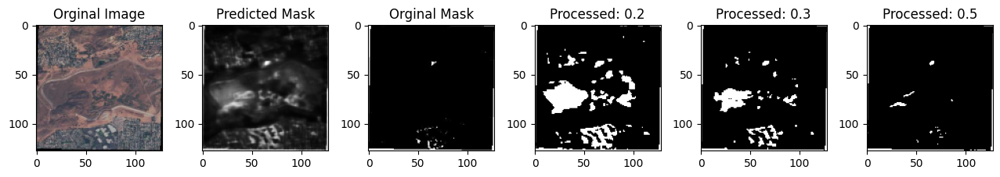

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7483 - loss: 0.2700
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7448 - loss: 0.276


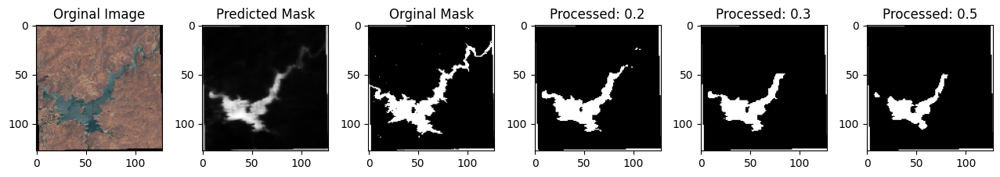

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7450 - loss: 0.2757
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7552 - loss: 0.24


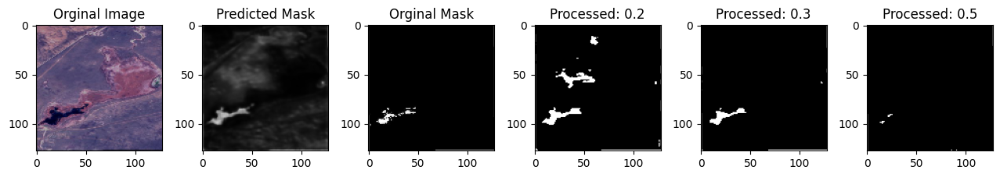

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7552 - loss: 0.2447
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7614 - loss: 0.23


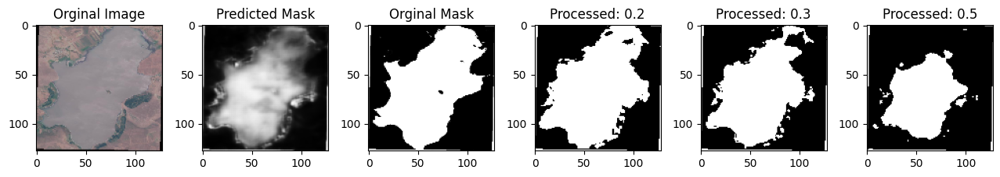

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7613 - loss: 0.2395
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7577 - loss: 0.24


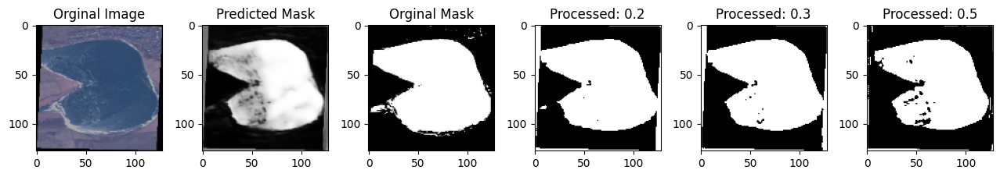

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7577 - loss: 0.2443
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7533 - loss: 0.25


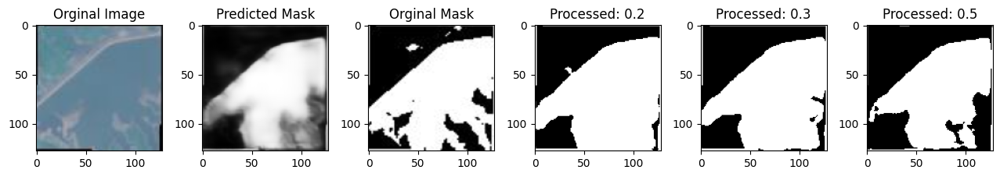

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7533 - loss: 0.2523
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7596 - loss: 0.24


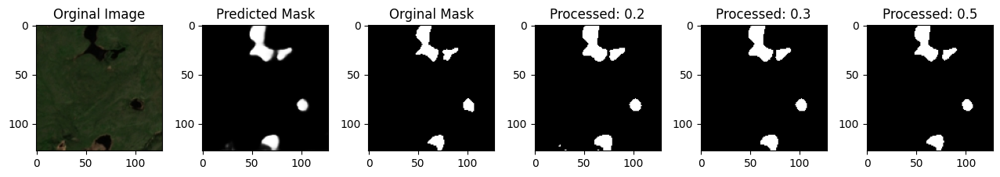

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.7595 - loss: 0.2420
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7582 - loss: 0.24


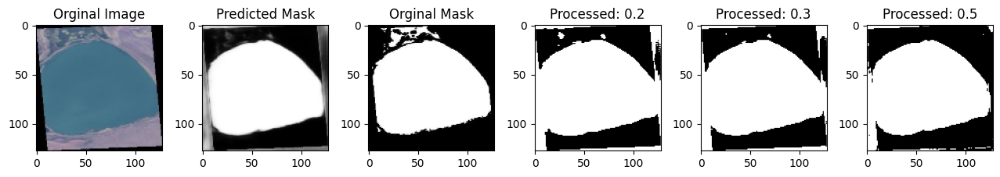

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7582 - loss: 0.2421
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7577 - loss: 0.231


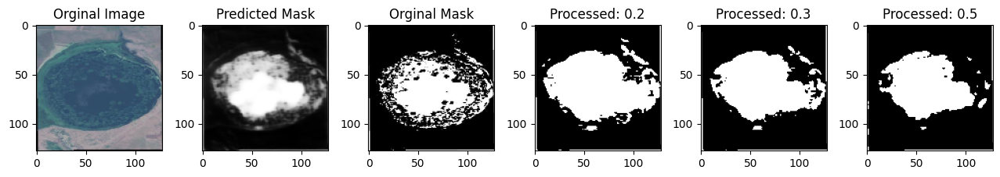

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7577 - loss: 0.2318
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7589 - loss: 0.231


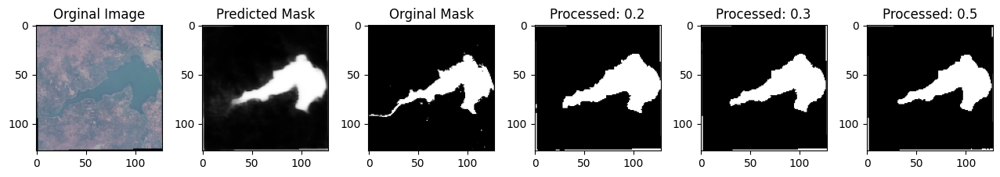

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7590 - loss: 0.2318
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7643 - loss: 0.22


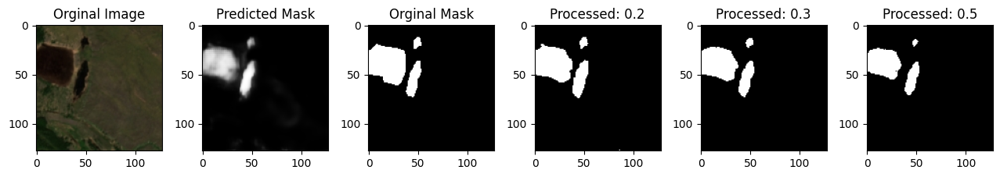

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7642 - loss: 0.2289
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7682 - loss: 0.216


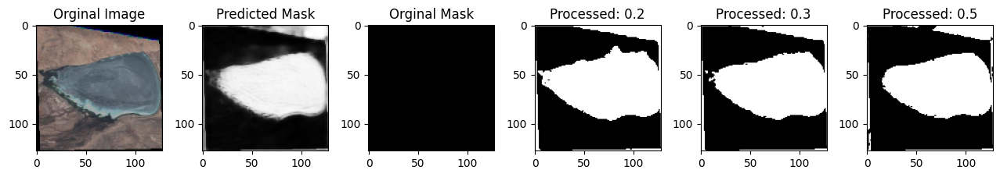

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7682 - loss: 0.2166
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7610 - loss: 0.23


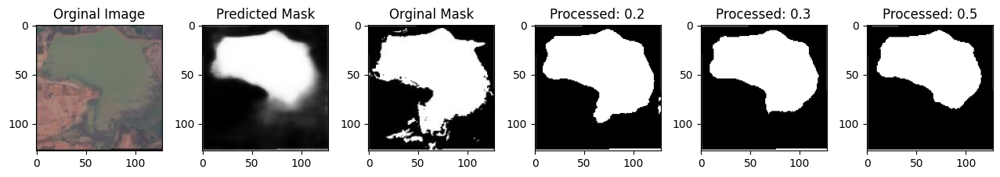

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7611 - loss: 0.2347
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7684 - loss: 0.21


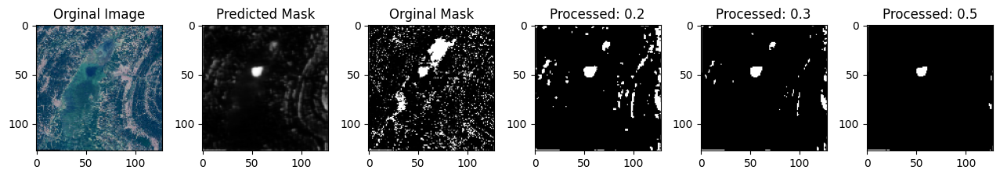

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7683 - loss: 0.2128
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7643 - loss: 0.22


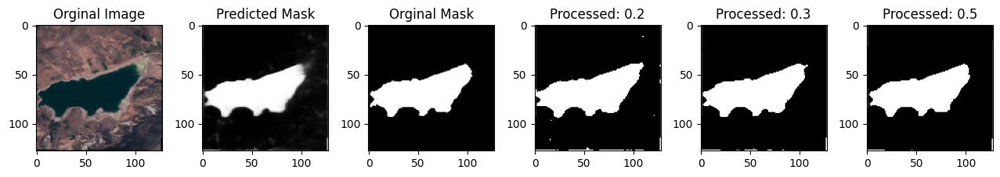

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7643 - loss: 0.2232
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7639 - loss: 0.22


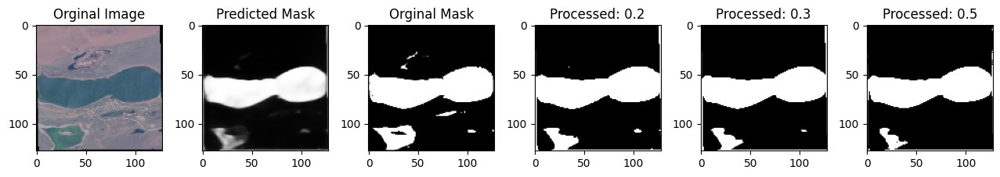

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7639 - loss: 0.2218
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7657 - loss: 0.22


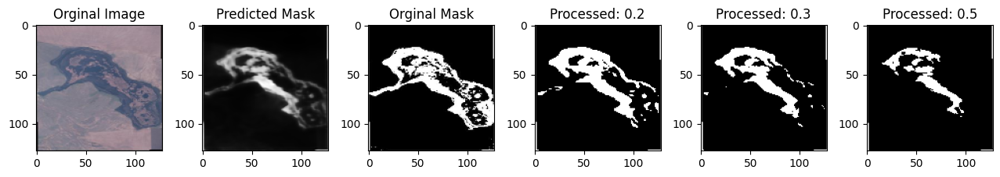

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7657 - loss: 0.2237
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7657 - loss: 0.21


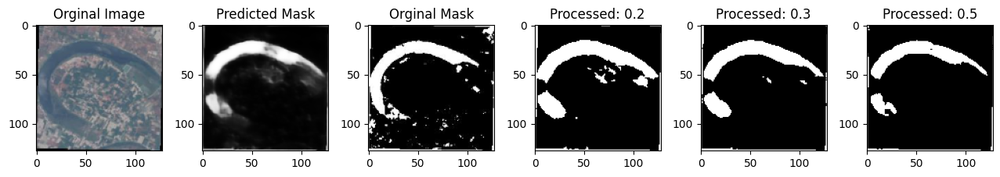

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7657 - loss: 0.2192
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7694 - loss: 0.21


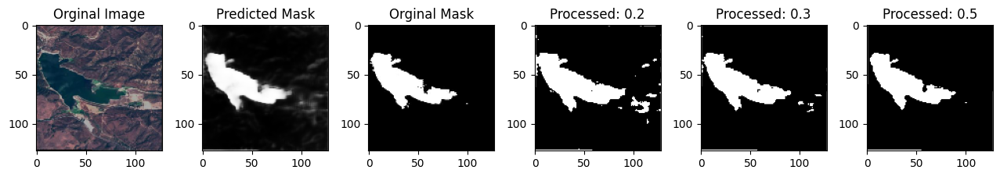

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7693 - loss: 0.2140
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7602 - loss: 0.225


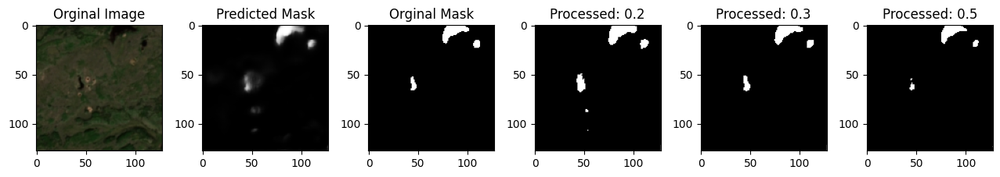

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7602 - loss: 0.2257
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7664 - loss: 0.21


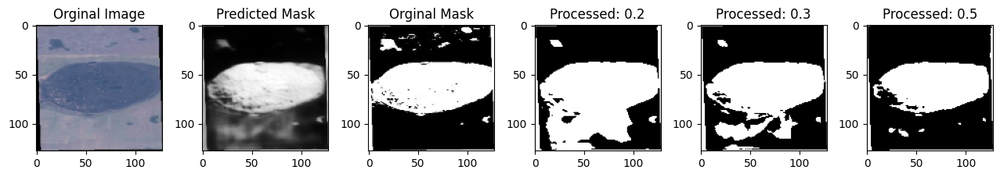

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7664 - loss: 0.2196
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7642 - loss: 0.22


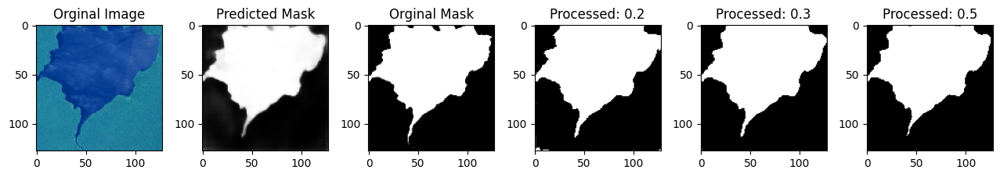

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7642 - loss: 0.2287
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7659 - loss: 0.221


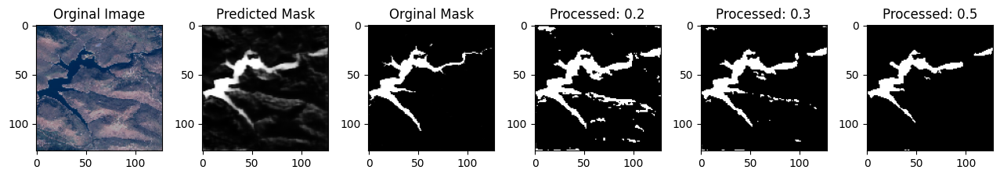

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7659 - loss: 0.2217
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7543 - loss: 0.25


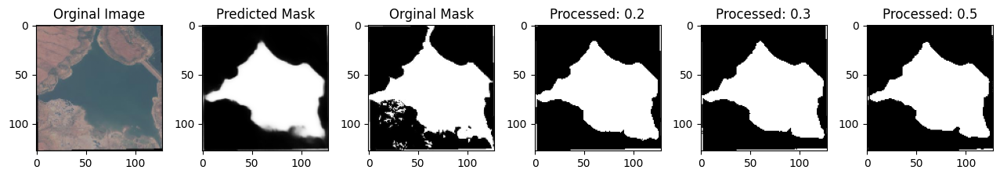

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7543 - loss: 0.2502
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7607 - loss: 0.23


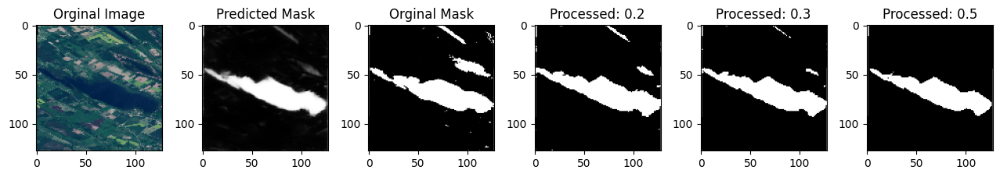

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7607 - loss: 0.2349
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7577 - loss: 0.23


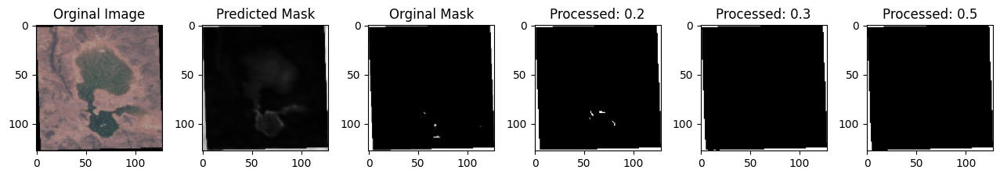

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7578 - loss: 0.2308
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7670 - loss: 0.21


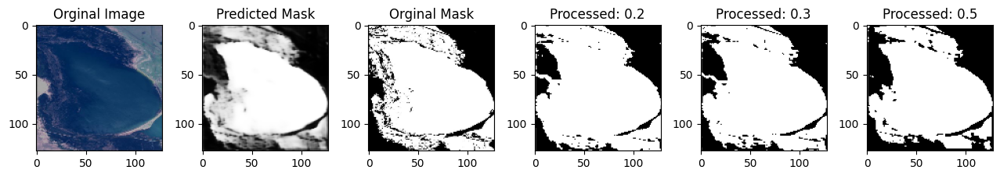

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7670 - loss: 0.2171
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7691 - loss: 0.213


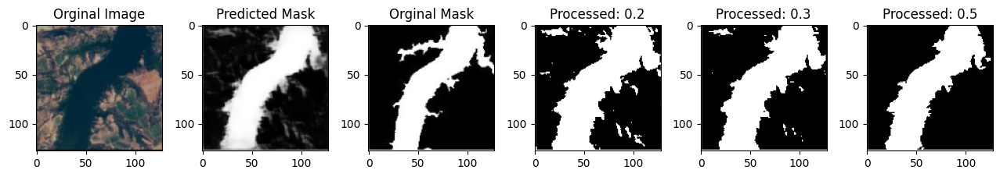

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7690 - loss: 0.2138
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7700 - loss: 0.20


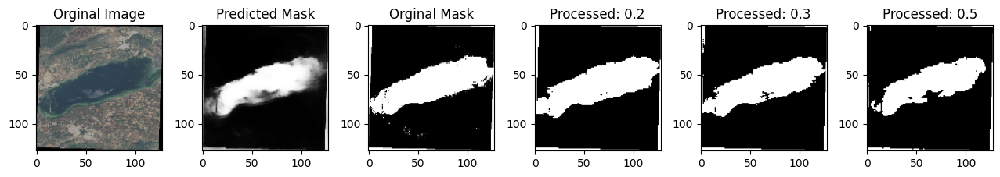

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7699 - loss: 0.2100
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7496 - loss: 0.270


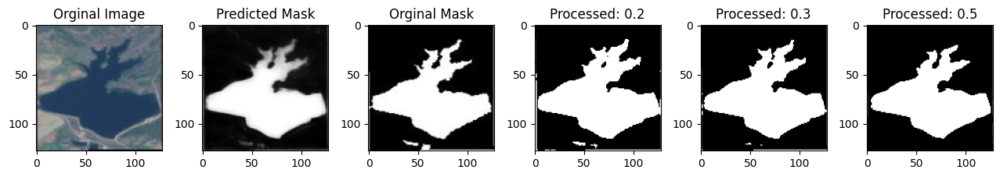

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7496 - loss: 0.2708
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7567 - loss: 0.25


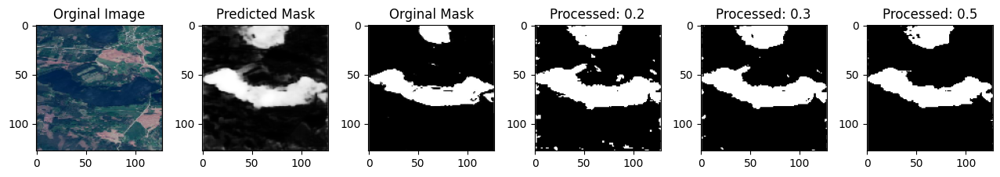

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7568 - loss: 0.2515
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7642 - loss: 0.228


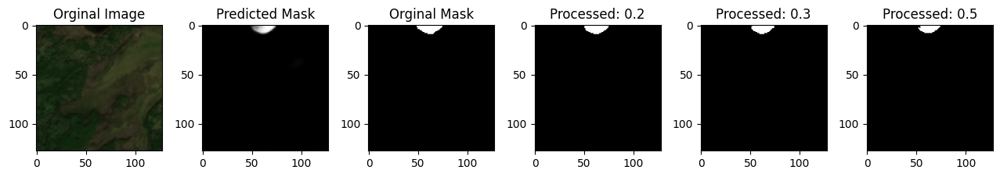

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7643 - loss: 0.2288
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7677 - loss: 0.21


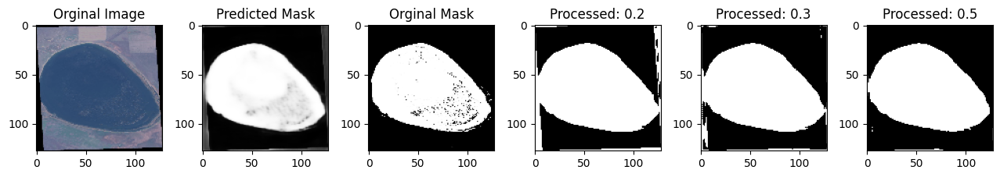

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.7678 - loss: 0.2144
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7697 - loss: 0.21


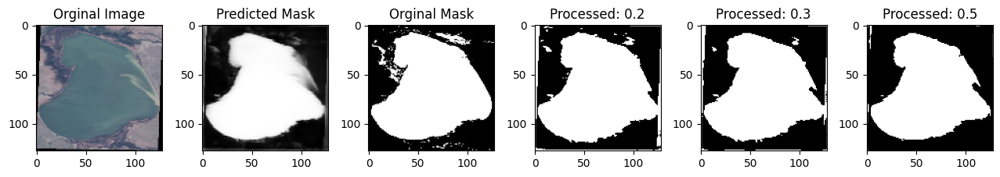

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7696 - loss: 0.2165
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7550 - loss: 0.24


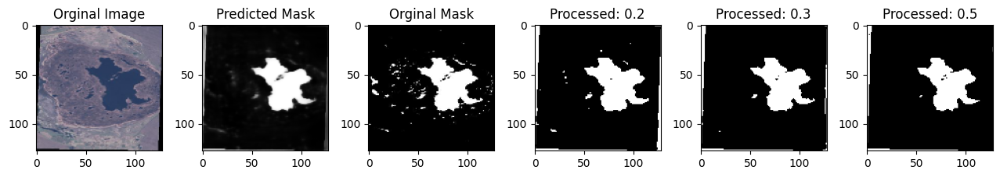

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7551 - loss: 0.2457
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7698 - loss: 0.21


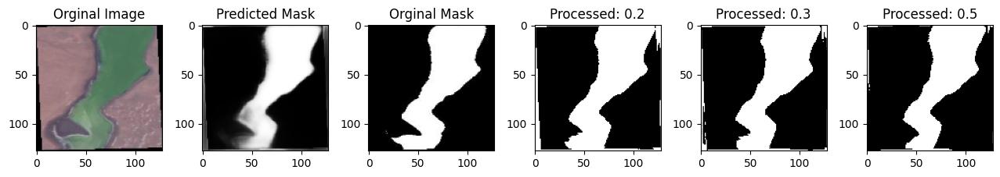

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7697 - loss: 0.2133
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7617 - loss: 0.22


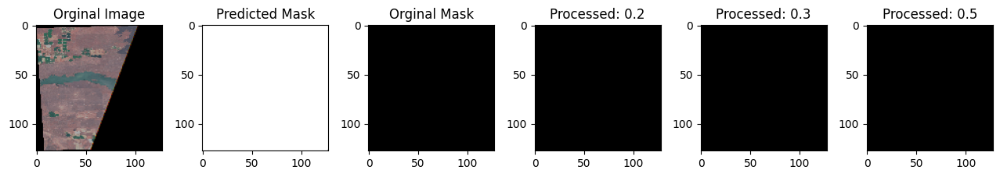

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7618 - loss: 0.2210
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7656 - loss: 0.20


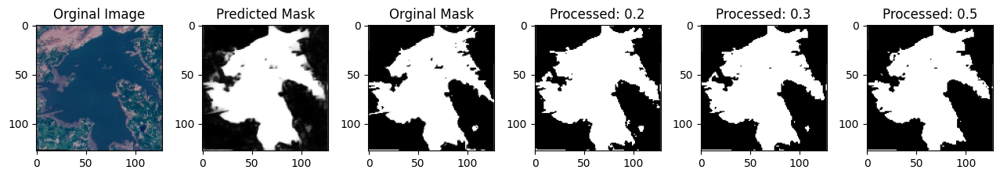

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7656 - loss: 0.2099
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7667 - loss: 0.21


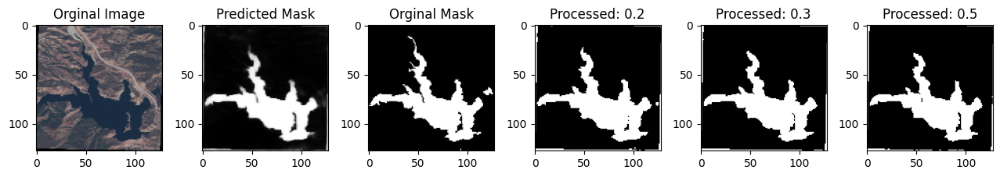

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7667 - loss: 0.2130
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7651 - loss: 0.21


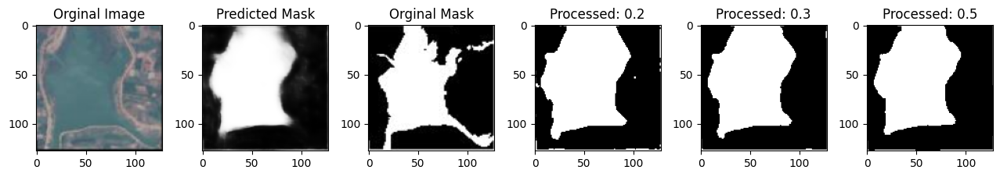

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - accuracy: 0.7653 - loss: 0.2164
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7728 - loss: 0.201


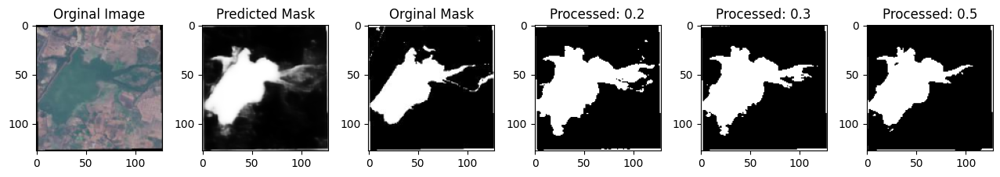

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7728 - loss: 0.2015
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7669 - loss: 0.20


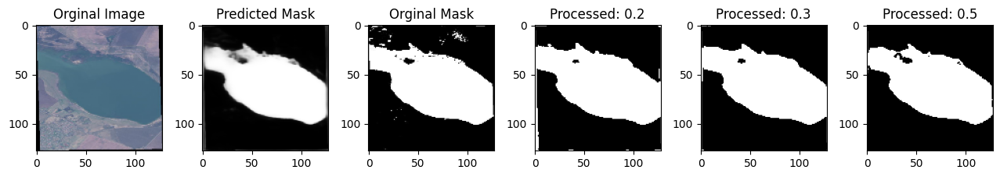

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7669 - loss: 0.2047
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7699 - loss: 0.21


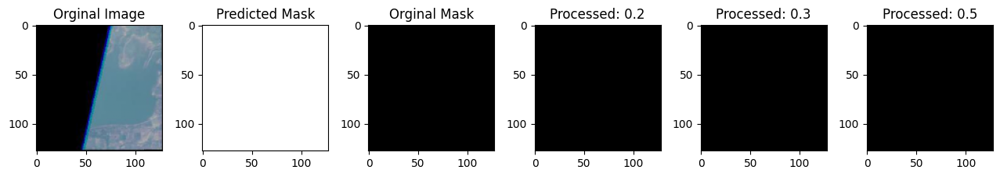

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7698 - loss: 0.2116
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7709 - loss: 0.20


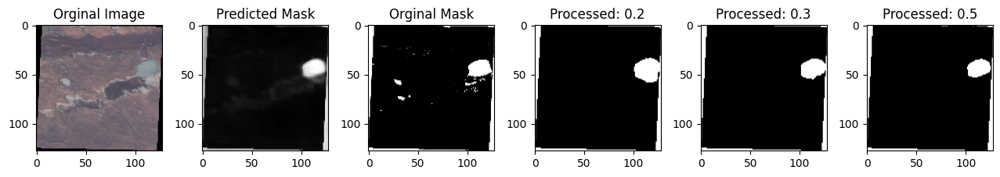

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7709 - loss: 0.2051
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7660 - loss: 0.21


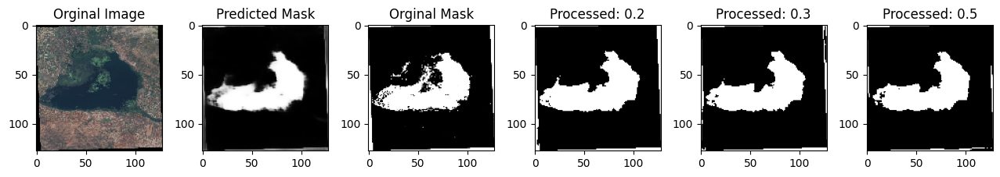

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7660 - loss: 0.2139
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7764 - loss: 0.19


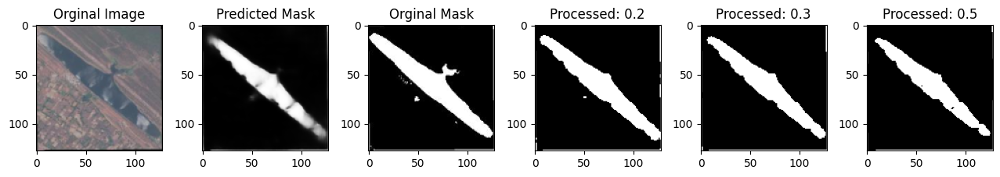

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7763 - loss: 0.1928
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7740 - loss: 0.19


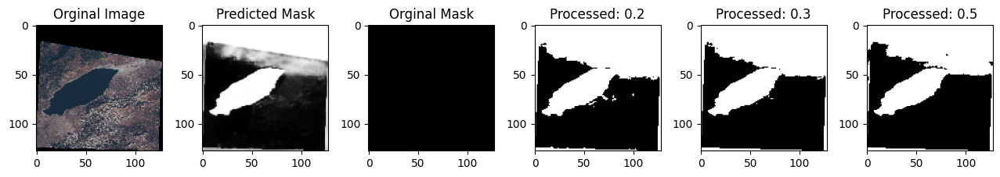

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7740 - loss: 0.1969
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7661 - loss: 0.20


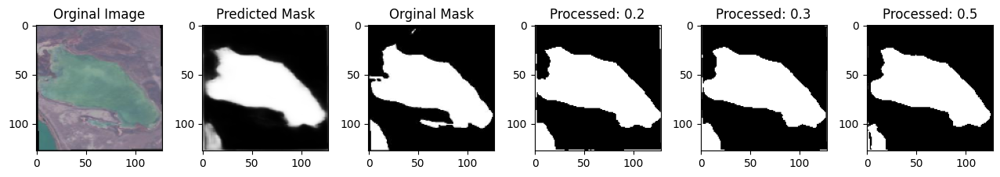

99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.7662 - loss: 0.2075
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7761 - loss: 0.19


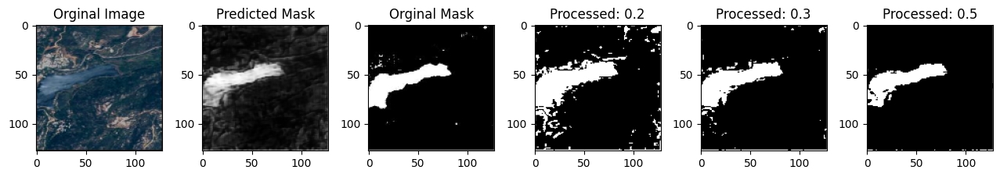

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7761 - loss: 0.1912
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7702 - loss: 0.21


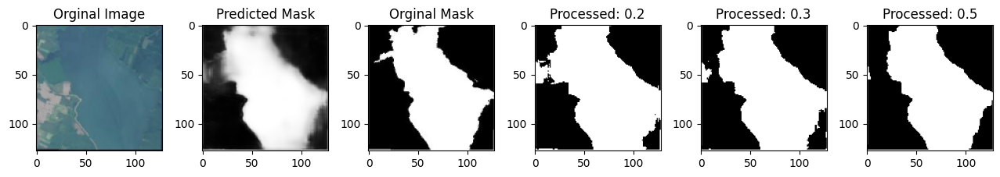

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7702 - loss: 0.2159
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7720 - loss: 0.193


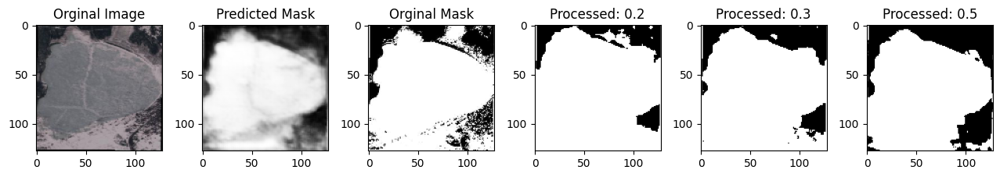

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7721 - loss: 0.1936
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7724 - loss: 0.196


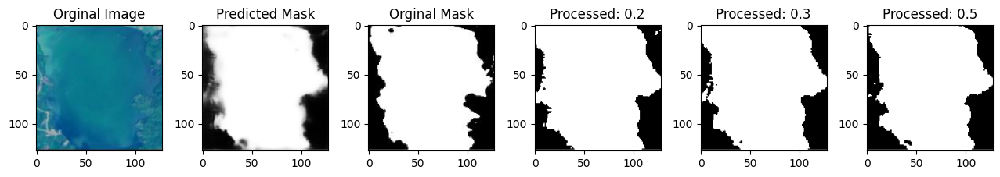

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7725 - loss: 0.1964
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/stepep - accuracy: 0.7681 - loss: 0.199


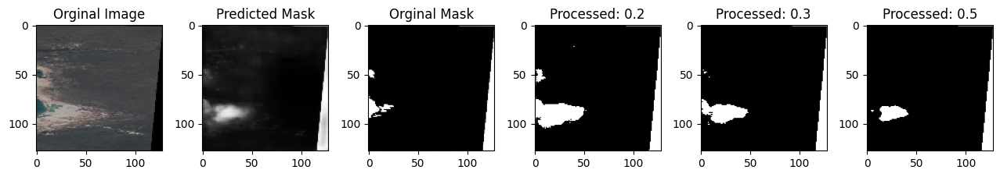

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7682 - loss: 0.1996
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7749 - loss: 0.189


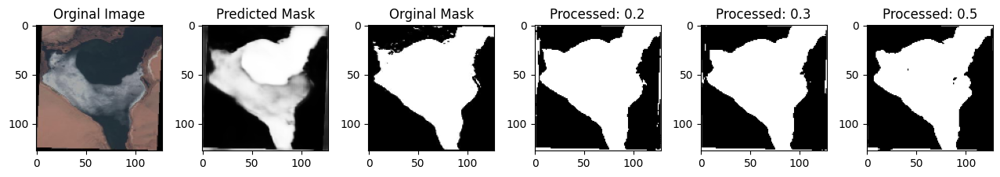

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7749 - loss: 0.1895
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7745 - loss: 0.18


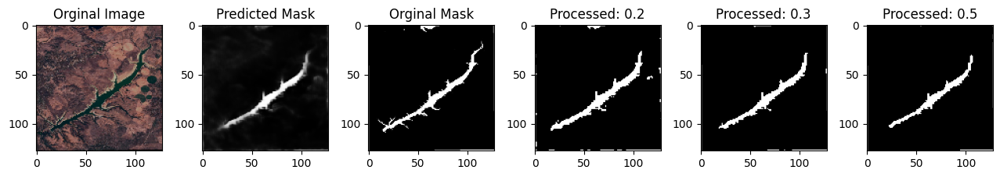

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7745 - loss: 0.1894
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7752 - loss: 0.18


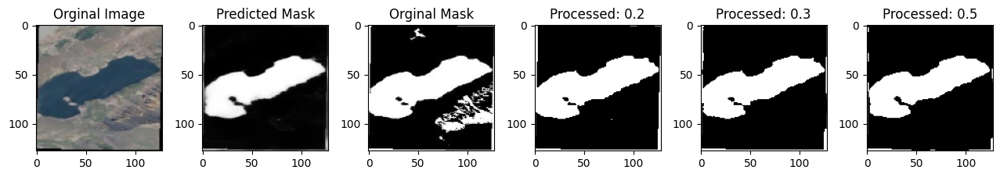

99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7752 - loss: 0.1897
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7759 - loss: 0.193


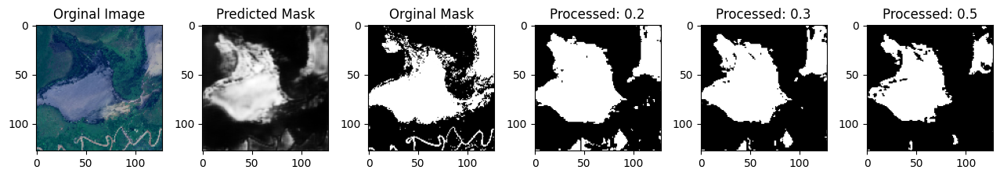

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.7759 - loss: 0.1931
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7723 - loss: 0.205


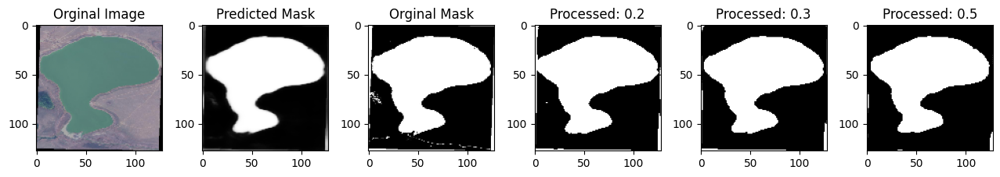

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7723 - loss: 0.2050
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7730 - loss: 0.19


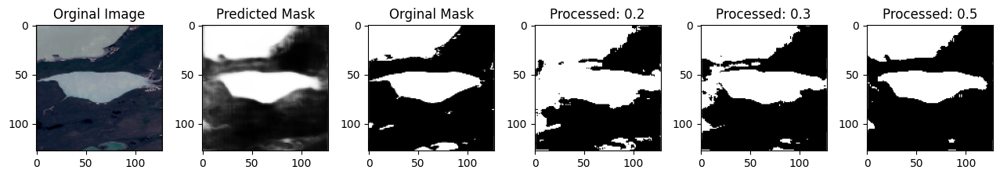

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7730 - loss: 0.1952
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7731 - loss: 0.189


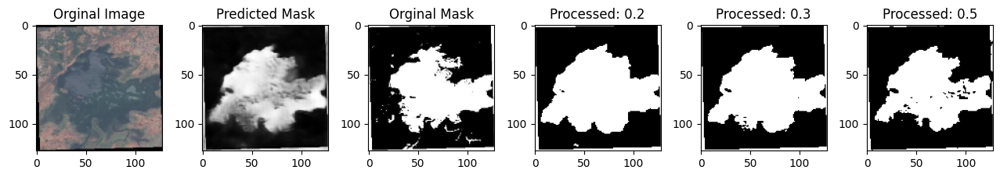

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7731 - loss: 0.1892
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7714 - loss: 0.192


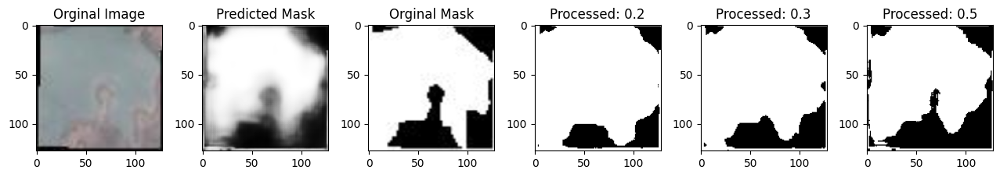

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7714 - loss: 0.1929
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7663 - loss: 0.20


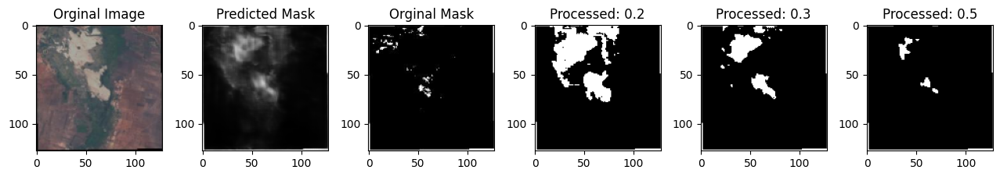

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.7663 - loss: 0.2038
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/steptep - accuracy: 0.7761 - loss: 0.19


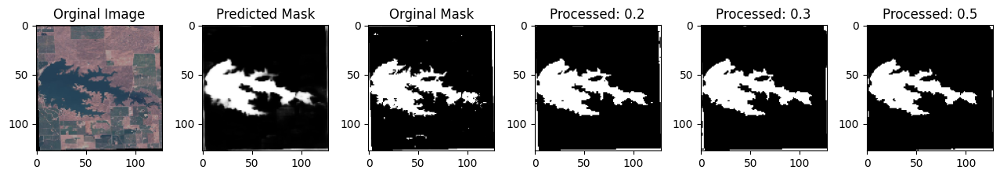

99/99 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.7761 - loss: 0.1911
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7742 - loss: 0.18


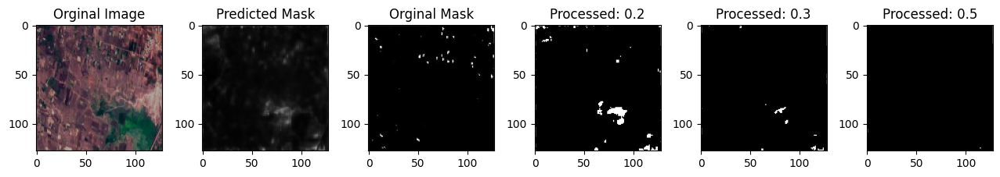

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.7742 - loss: 0.1881
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7794 - loss: 0.181


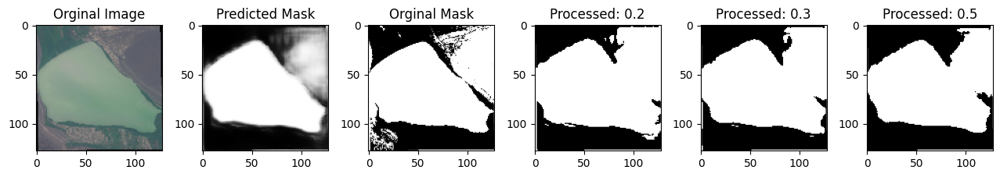

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7793 - loss: 0.1819
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7743 - loss: 0.18


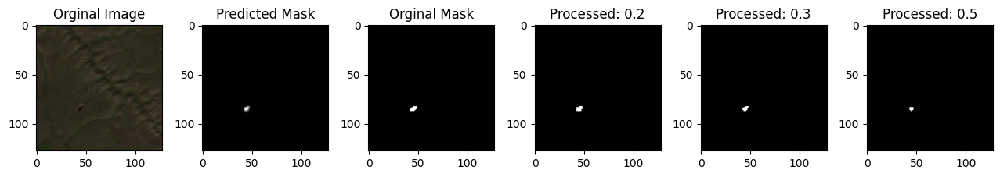

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7744 - loss: 0.1831
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7835 - loss: 0.179


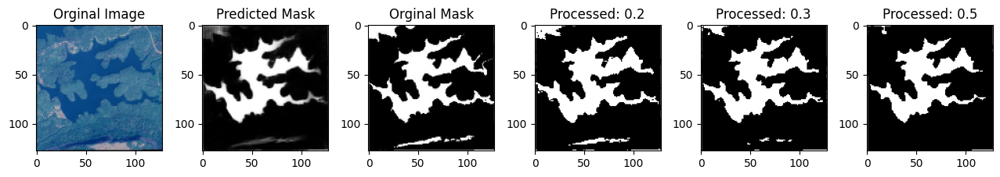

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7835 - loss: 0.1793
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7749 - loss: 0.186


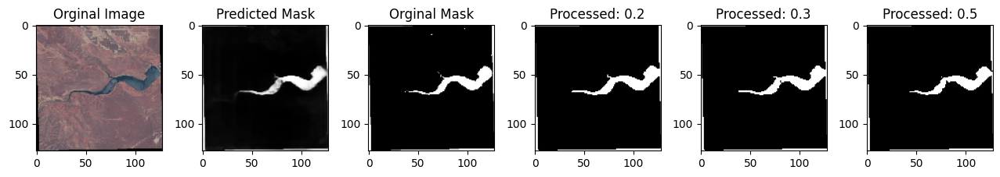

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7749 - loss: 0.1866
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7751 - loss: 0.187


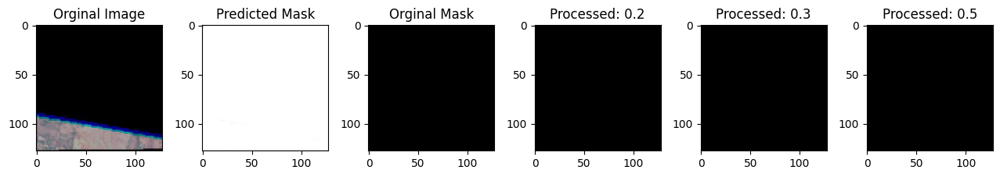

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7752 - loss: 0.1878
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7750 - loss: 0.187


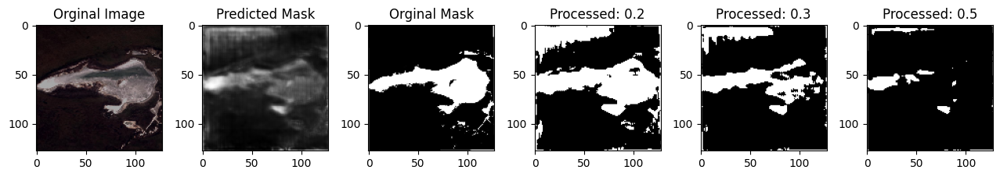

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7750 - loss: 0.1878
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7736 - loss: 0.18


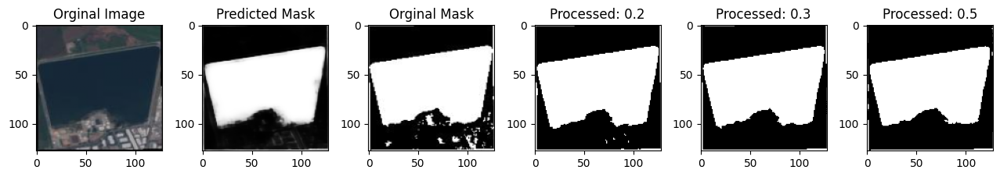

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - accuracy: 0.7737 - loss: 0.1883
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/stepep - accuracy: 0.7810 - loss: 0.173


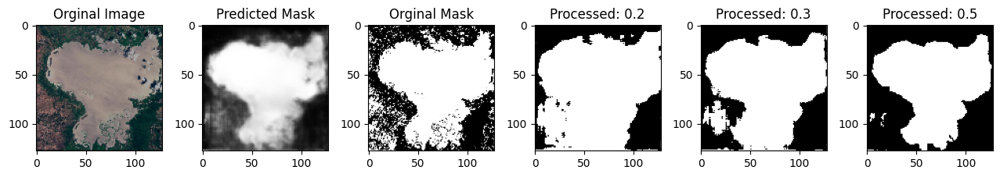

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - accuracy: 0.7810 - loss: 0.1740
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7796 - loss: 0.17


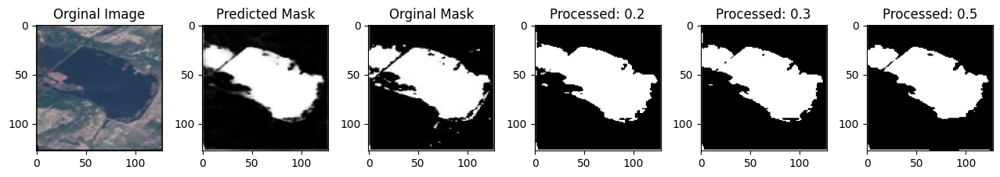

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.7795 - loss: 0.1713
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7748 - loss: 0.17


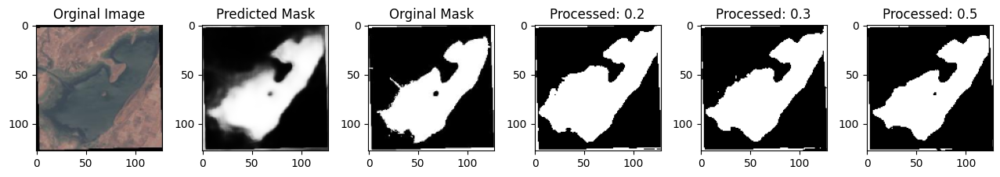

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.7748 - loss: 0.1795
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7754 - loss: 0.180


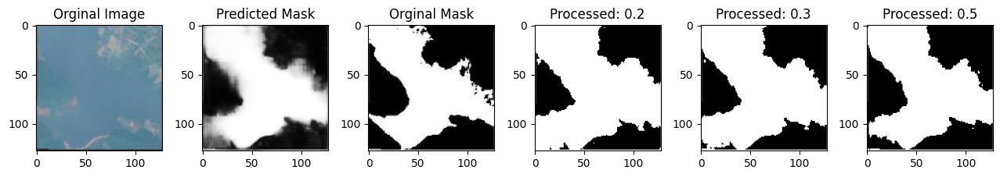

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.7754 - loss: 0.1805
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/stepep - accuracy: 0.7727 - loss: 0.18


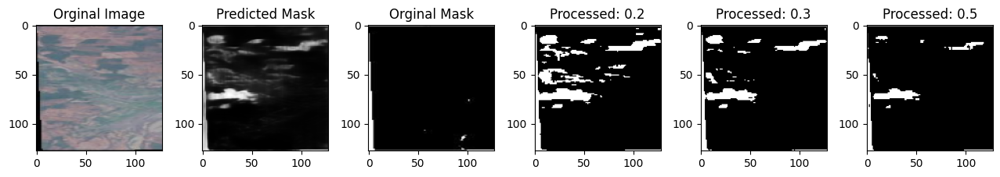

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.7728 - loss: 0.1830
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/stepep - accuracy: 0.7768 - loss: 0.175


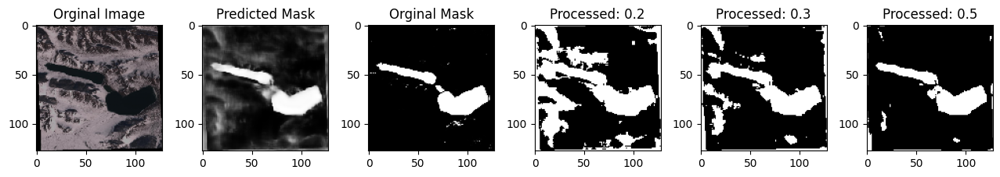

99/99 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - accuracy: 0.7768 - loss: 0.1758


In [9]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

In [10]:
from datetime import datetime

# Get the current date and time
current_time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')

# Save the model with the current date and time in the filename
model.save(f'../models/{current_time}.keras')

In [ ]:
# Make predictions
predictions = model.predict(images_test)